# Introducción

En este notebook se implementará el modelo _EDSR_ para hacer upscaling

In [19]:
import os
import numpy as np
from PIL import Image
from PIL import ImageFilter

import cv2
import matplotlib.pyplot as plt

import tensorflow as tf

import random
import pathlib
from IPython import display

import pandas as pd

import time
import glob

# Preparacion del Dataset

In [20]:
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [21]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  1


In [22]:
train_input_dir =  './Cat_LR/*.jpg'
train_target_dir =  './Cat_HR/*.jpg'

In [23]:
def load_image(file_path):
    img = tf.io.read_file(file_path)
    img = tf.image.decode_jpeg(img)
    img = tf.cast(img, tf.float32)
    img = (tf.cast(img, tf.float32) / 255)
    return img

In [24]:
def preprocess_image(file_path_input, file_path_target):
    input_img = load_image(file_path_input)
    target_img = load_image(file_path_target)
    return input_img, target_img

In [25]:
BATCH_SIZE = 4

In [26]:
train_input_dataset = tf.data.Dataset.list_files(str(train_input_dir), shuffle=False)
train_target_dataset = tf.data.Dataset.list_files(str(train_target_dir), shuffle=False)
train_dataset = tf.data.Dataset.zip((train_input_dataset, train_target_dataset))
train_dataset = train_dataset.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.batch(BATCH_SIZE)

# Creacion del modelo

El modelo _EDSR_ se entrena por parches NxN en este caso en el paper se entrena a 48x48.

<img src="EDSR_structure.png">

+ _Falta por implementar el shuffle_


In [36]:
class EDSR(tf.keras.models.Model):
    
    def __init__(self, B, F, scale_factor=0.1):
        super(EDSR, self).__init__()
        self.B = B # Numero de resblocks
        self.F = F # Numero de Filtros
        self.scale_factor = scale_factor  # Factor de escala residual

        # Primeras capas
        xinput = tf.keras.layers.Input(shape=(48,48,3))
        xlast = x = tf.keras.layers.Conv2D(filters=self.F, kernel_size=3, strides=1, padding='SAME')(xinput)
        
        # B ResBlocks
        for i in range(self.B):
            x = self.res_block(x)

        x = tf.keras.layers.Conv2D(filters=self.F, kernel_size=3, strides=1, padding='SAME')(x)

        x = tf.keras.layers.Add()([x,xlast])

        # Upsample
        x = tf.keras.layers.Conv2D(filters= (self.F * 4), kernel_size=3, strides=1, padding='SAME')(x)
        x = tf.keras.layers.Lambda(lambda x : tf.nn.depth_to_space(x,2))(x)

        out = tf.keras.layers.Conv2D(filters=3, kernel_size=3, strides=1, padding='SAME')(x)

        self.model = tf.keras.models.Model(xinput, out)


    def res_block(self, x):
        x1 = tf.keras.layers.Conv2D(filters=self.F, kernel_size=3, strides=1, padding='SAME', activation="relu")(x)
        x2 = tf.keras.layers.Conv2D(filters=self.F, kernel_size=3, strides=1, padding='SAME')(x1)

        x2 = x2 * self.scale_factor
        output = tf.keras.layers.Add()([x2, x])
        return output
    


    def call(self, inputs):
        return self.model(inputs)


In [37]:
B = 32
F = 256

In [38]:
model = EDSR(B=32, F=256, scale_factor=0.1)

In [39]:
model.model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 48, 48, 3)]  0           []                               
                                                                                                  
 conv2d_202 (Conv2D)            (None, 48, 48, 256)  7168        ['input_4[0][0]']                
                                                                                                  
 conv2d_203 (Conv2D)            (None, 48, 48, 256)  590080      ['conv2d_202[0][0]']             
                                                                                                  
 conv2d_204 (Conv2D)            (None, 48, 48, 256)  590080      ['conv2d_203[0][0]']             
                                                                                            

In [40]:
lr = 0.0001  
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

model.compile(loss='mean_absolute_error', optimizer=optimizer,metrics = [tf.keras.metrics.CategoricalAccuracy()])

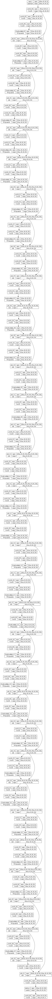

In [41]:
tf.keras.utils.plot_model(model.model, show_shapes=True, dpi=64)

In [42]:
history = model.fit(train_dataset,epochs=6)

Epoch 1/6
1920/1920 [==============================] - 435s 223ms/step - loss: 0.0195 - categorical_accuracy: 0.8443
Epoch 2/6
1920/1920 [==============================] - 423s 220ms/step - loss: 0.0142 - categorical_accuracy: 0.8929
Epoch 3/6
1920/1920 [==============================] - 419s 218ms/step - loss: 0.0135 - categorical_accuracy: 0.9049
Epoch 4/6
1920/1920 [==============================] - 406s 212ms/step - loss: 0.0130 - categorical_accuracy: 0.9099
Epoch 5/6
1920/1920 [==============================] - 407s 212ms/step - loss: 0.0129 - categorical_accuracy: 0.9123
Epoch 6/6
1920/1920 [==============================] - 408s 212ms/step - loss: 0.0123 - categorical_accuracy: 0.9187


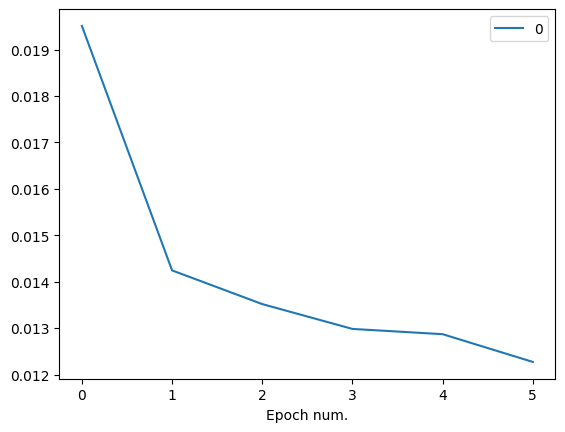

In [52]:
pd.DataFrame(history.history['loss']).plot()
plt.xlabel('Epoch num.')
plt.show()

In [53]:
def extract_patches(image, patch_size):
    patches = []
    height, width = image.shape[:2]
    for y in range(0, height - patch_size + 1, patch_size):
        for x in range(0, width - patch_size + 1, patch_size):
            patch = image[y:y+patch_size, x:x+patch_size]
            patch = tf.cast(patch, tf.float32)
            patch = (tf.cast(patch, tf.float32) / 255)
            patches.append(patch)
    return patches

def reconstruct_image_from_patches(patches, image_shape):
    height, width, _ = image_shape
    patch_size = patches[0].shape[1] 
    rows = (height // patch_size)
    cols = (width // patch_size)

    reconstructed_image = np.zeros(image_shape, dtype=np.float32)

    patch_index = 0

    for i in range(rows):
        for j in range(cols):

            patch = patches[patch_index]

            y_start = i * patch_size
            x_start = j * patch_size

            reconstructed_image[y_start:y_start+patch_size, x_start:x_start+patch_size] = patch

            patch_index += 1

    return reconstructed_image

image = cv2.imread("image.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


patches = extract_patches(image, patch_size=48)


reconstruct = []

for p in patches:
    p = np.expand_dims(p, axis=0)

    reconstruct.append(model.predict(p,verbose=2))

1/1 - 0s - 19ms/epoch - 19ms/step
1/1 - 0s - 21ms/epoch - 21ms/step
1/1 - 0s - 18ms/epoch - 18ms/step
1/1 - 0s - 20ms/epoch - 20ms/step
1/1 - 0s - 21ms/epoch - 21ms/step
1/1 - 0s - 20ms/epoch - 20ms/step
1/1 - 0s - 18ms/epoch - 18ms/step
1/1 - 0s - 18ms/epoch - 18ms/step
1/1 - 0s - 18ms/epoch - 18ms/step
1/1 - 0s - 19ms/epoch - 19ms/step
1/1 - 0s - 19ms/epoch - 19ms/step
1/1 - 0s - 20ms/epoch - 20ms/step
1/1 - 0s - 19ms/epoch - 19ms/step
1/1 - 0s - 19ms/epoch - 19ms/step
1/1 - 0s - 18ms/epoch - 18ms/step
1/1 - 0s - 18ms/epoch - 18ms/step
1/1 - 0s - 20ms/epoch - 20ms/step
1/1 - 0s - 19ms/epoch - 19ms/step
1/1 - 0s - 19ms/epoch - 19ms/step
1/1 - 0s - 20ms/epoch - 20ms/step
1/1 - 0s - 18ms/epoch - 18ms/step
1/1 - 0s - 18ms/epoch - 18ms/step
1/1 - 0s - 19ms/epoch - 19ms/step
1/1 - 0s - 20ms/epoch - 20ms/step
1/1 - 0s - 19ms/epoch - 19ms/step
1/1 - 0s - 20ms/epoch - 20ms/step
1/1 - 0s - 19ms/epoch - 19ms/step
1/1 - 0s - 18ms/epoch - 18ms/step
1/1 - 0s - 18ms/epoch - 18ms/step
1/1 - 0s - 18m

In [63]:
image = cv2.imread("image.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

height, width, _ = image.shape

figsize = height, width

# Crear la figura con el tamaño real de la imagen
fig = plt.figure(figsize=figsize)

# Mostrar la imagen
plt.imshow(image)
plt.axis('off')  # Desactivar los ejes
plt.show()

ValueError: Image size of 141400x212100 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 141400x212100 with 1 Axes>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


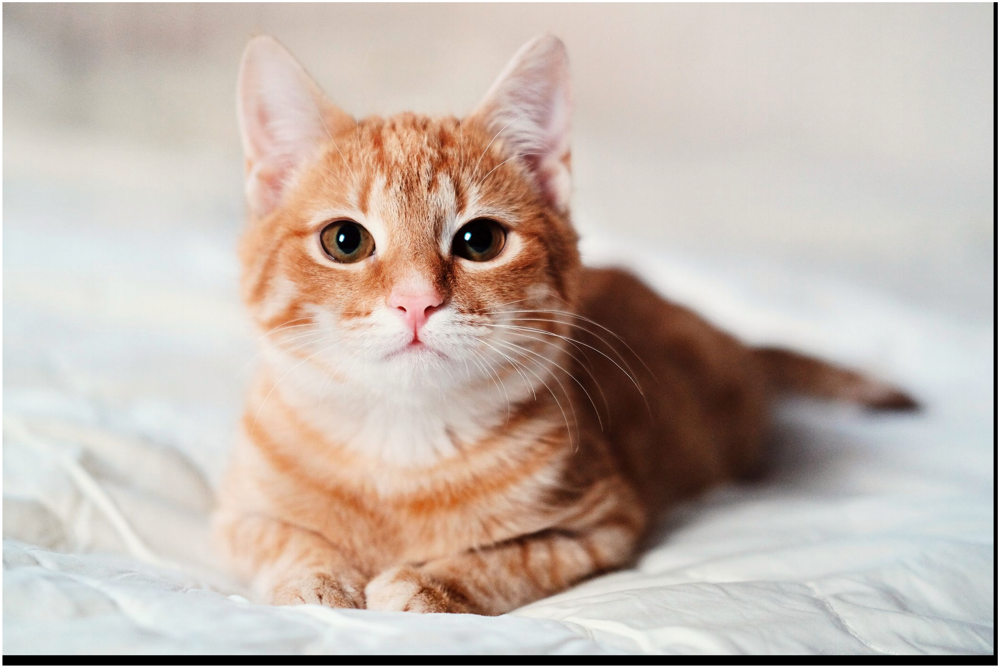

In [64]:
height, width, _ = image.shape

image = reconstruct_image_from_patches(reconstruct,[height*2,width*2,3])

dpi = 80  # Puntos por pulgada

# Calcular el tamaño de la figura en pulgadas
figsize = width * 2 / dpi, height * 2 / dpi

# Crear la figura con el tamaño real de la imagen
fig = plt.figure(figsize=figsize)

# Mostrar la imagen
plt.imshow(image)
plt.axis('off')  # Desactivar los ejes
plt.show()

In [68]:
image = image * 255
imagen = Image.fromarray(image.astype('uint8'))  # Asegúrate de que el tipo de datos sea adecuado (por ejemplo, uint8 para valores de 0 a 255)

imagen.save("nombre_de_archivo.jpg")

In [65]:
print(image.shape)

(2828, 4242, 3)


In [58]:
image = cv2.imread("image.jpg")
print(image.shape)

(1414, 2121, 3)
